<h1 style="text-align: center;"> <b>MENTAL HEALTH EDA </b></h1>

<h2 style="text-align: center;"> Report </h1>

<h5 style="text-align: center;"> Luna Pérez Troncoso </h5>     

<br/><br/>

<br/><br/>

<h2 style="text-align: center;"> <b> PART 2</b>: Data visualization using choropleth maps  </h2> 

<br/><br/>

#### **Preparation, data collection and data loading**

In order to represent the mental health disorders prevalence and burden data of the different countries compiled in the previusly mentioned [kaggle dataset](https://www.kaggle.com/datasets/imtkaggleteam/mental-health) and **visualize its progression between 1990-2019** we are going to use **folium library cloropleth maps**. **Numpy, Pandas and Geopandas libraries** are also requered in orden to load, clean, clasify and operate with data and GeoData. In adition **branca.colormap and matplotlib modules** are going to be used to choose the **colormaps** of interest.

In [3]:
import numpy as np
import pandas as pd
import folium 
from folium import plugins
import geopandas as gpd
import branca.colormap as cm
import matplotlib.pyplot as plt
import matplotlib as mpl

#### **Data Loading**

In [4]:
df_mh=pd.read_csv("./data/mental_health/1- mental-illnesses-prevalence.csv")
df_mh_burden=pd.read_csv("./data/mental_health/2- burden-disease-from-each-mental-illness(1).csv")

#### **Data cleaning**

As we have mentioned before **entities contains mixed type of data**. In this part we will **focus exclusively on countries' data**. Consequently global, continents, geographic regions by WHO, geographic regions by WB, income level groups and **other entities** like *Euro OECD Countries* and *European Union* data **were dropped**. Again, prevalence and burden columns long indexes of the different mental health disorders were renamed to simplify indexing, slicing and masking. .

In [5]:
df_mh=pd.read_csv("./data/mental_health/1- mental-illnesses-prevalence.csv")
df_mh.columns=["country","code","year","Schizophrenia","Depressive","Anxiety","Bipolar","Eating"]
df_mh_world= df_mh[df_mh.country =="World"]
df_mh.drop(df_mh.index[(df_mh.country =='Low-income countries')|(df_mh.country =='Lower-middle-income countries')|(df_mh.country =='Upper-middle-income countries')|(df_mh.country =='High-income countries')],axis=0,inplace=True)
df_mh.drop(df_mh.index[(df_mh.country =='European Union (27)')|(df_mh.country =="World")],inplace=True)
df_mh.drop(df_mh.index[(df_mh.country =="Asia (IHME GBD)")|(df_mh.country =='Europe (IHME GBD)')|(df_mh.country =='America (IHME GBD)')|(df_mh.country =='Africa (IHME GBD)')],axis=0,inplace=True)

In [6]:
df_mh_burden.columns=["country","code","year","Schizophrenia","Depressive","Anxiety","Bipolar","Eating"]
df_mh_burden_world= df_mh_burden[df_mh_burden.country =="World"]
df_mh_burden.drop(df_mh_burden.index[(df_mh_burden.country == 'Low income (WB)')|(df_mh_burden.country == "Lower middle income (WB)")|(df_mh_burden.country =='Middle income (WB)')|(df_mh_burden.country =='High income (WB)')],axis=0,inplace=True)
df_mh_burden.drop(df_mh_burden.index[(df_mh_burden.country =='Europe & Central Asia (WB)')|(df_mh_burden.country =='East Asia & Pacific (WB)')|(df_mh_burden.country =='Latin America & Caribbean (WB)')|(df_mh_burden.country =='Middle East & North Africa (WB)')|(df_mh_burden.country =='North America (WB)')|(df_mh_burden.country =='South Asia (WB)')|(df_mh_burden.country =='Sub-Saharan Africa (WB)')],axis=0,inplace=True)
df_mh_burden.drop(df_mh_burden.index[(df_mh_burden.country =='Western Pacific Region (WHO)')|(df_mh_burden.country =='Eastern Mediterranean Region (WHO)')|(df_mh_burden.country =='European Region (WHO)')|(df_mh_burden.country =='Region of the Americas (WHO)')|(df_mh_burden.country =='African Region (WHO)')|(df_mh_burden.country =='South-East Asia Region (WHO)')|(df_mh_burden.country =="World")],axis=0,inplace=True)

### Data Preparation

First of all, we are going to **calculate** the **mean values of the different countries prevalence and burden** data between the 1990 and 2019 period, using groupby pandas function.
In order to **generate choropleth maps** with a **mouse interactive highlight** feature that **shows countries' prevalence or burden**.

In [ ]:
df_mh_mean=df_mh.iloc[:,1:].groupby("code").mean().iloc[:,1:]
df_mh_mean.reset_index(inplace=True,names=["code"])
df_mh_burden_mean=df_mh_burden.iloc[:,1:].groupby("code").mean().iloc[:,1:]
df_mh_burden_mean.reset_index(inplace=True,names=["code"])
fname = 'countries.geo.json'
geo = gpd.read_file(fname)

geo_data=geo.merge(df_mh_mean,left_on="id",right_on="code",how="inner")

### **Choropleth Maps Representations of Mean Prevalence and Burden of Mental Health Disorders**
  
In this section of the EDA we are going to represent the **mean prevalence and burden** data thought the time period between 1990 and 2019 **of the different countries** that are recorded in [OurWorldInData platform](https://ourworldindata.org/). In order to do that, we are going to generate **choropleth maps** use **folium** python library. 

In [68]:
colormap = cm.linear.YlOrRd_09.scale(geo_data['Anxiety'].min(), geo_data['Anxiety'].max()).to_step(7)
m = folium.Map(location=[0,0],zoom_start=2,width=1030,height=1000,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Anxiety Disorders Prevalence %"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Anxiety']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL=folium.features.GeoJson(geo_data,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Anxiety'],aliases=['Country','Anxiety Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m)
m.add_child(NIL)
title_html1 = '<h3 align="left" style="font-size:16px"><b>Global Anxiety Disorders Prevalence</b></h3>' 
m.get_root().html.add_child(folium.Element(title_html1))
m

In [69]:

colormap = cm.linear.YlOrRd_09.scale(geo_data['Schizophrenia'].min(), geo_data['Schizophrenia'].max()).to_step(7)
m = folium.Map(location=[0,0],zoom_start=2,width=1030,height=1000,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Schizophrenia Disorders Prevalence %"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Schizophrenia']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL=folium.features.GeoJson(geo_data,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Schizophrenia'],aliases=['Country','Schizophrenia Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m)
m.add_child(NIL)
title_html1 = '<h3 align="left" style="font-size:16px"><b>Global Schizophrenia Disorders Prevalence</b></h3>' 
m.get_root().html.add_child(folium.Element(title_html1))
m


In [70]:

colormap = cm.linear.YlOrRd_09.scale(geo_data['Eating'].min(), geo_data['Eating'].max()).to_step(7)
m = folium.Map(location=[0,0],zoom_start=2,width=1030,height=1000,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Eating Disorders Prevalence %"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Eating']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL=folium.features.GeoJson(geo_data,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Eating'],aliases=['Country','Eating Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m)
m.add_child(NIL)
title_html1 = '<h3 align="left" style="font-size:16px"><b>Global Eating Disorders Prevalence</b></h3>' 
m.get_root().html.add_child(folium.Element(title_html1))
m


In [71]:

colormap = cm.linear.YlOrRd_09.scale(geo_data['Bipolar'].min(), geo_data['Bipolar'].max()).to_step(7)
m = folium.Map(location=[0,0],zoom_start=2,width=1030,height=1000,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Bipolar Disorders Prevalence %"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Bipolar']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL=folium.features.GeoJson(geo_data,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Bipolar'],aliases=['Country','Bipolar Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m)
m.add_child(NIL)
title_html1 = '<h3 align="left" style="font-size:16px"><b>Global Bipolar Disorders Prevalence</b></h3>' 
m.get_root().html.add_child(folium.Element(title_html1))
m

In [72]:
colormap = cm.linear.YlOrRd_09.scale(geo_data['Depressive'].min(), geo_data['Depressive'].max()).to_step(7)
m = folium.Map(location=[0,0],zoom_start=2,width=1030,height=1000,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Depressive Disorders Prevalence %"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Depressive']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL=folium.features.GeoJson(geo_data,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Depressive'],aliases=['Country','Depressive Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m)
m.add_child(NIL)
title_html1 = '<h3 align="left" style="font-size:16px"><b>Global Depressive Disorders Prevalence</b></h3>' 
m.get_root().html.add_child(folium.Element(title_html1))
m


**Schizophrenia**
- **Highest deviations:** The **United States**, **New Zealand**, **Australia**, and several **Western European nations** (Netherlands, Ireland) display **substantially higher prevalence** than the global mean.   
- **Lowest deviations:** **Sub-Saharan African nations** such as **Somalia, Malawi, Mozambique, Burundi**, and the **Democratic Republic of Congo** are positioned **far below the world average**.  
- **Interpretation:** The pattern suggests that **schizophrenia is more frequently diagnosed in high-income contexts**, likely due to **better detection systems**, while **underdiagnosis and limited psychiatric resources** explain the low apparent prevalence in poorer regions.

**Depressive Disorders**
- **Highest deviations:** The **most extreme values** are found in **African and Middle Eastern countries** like **Uganda, Palestine, Greenland, and the Central African Republic**.
- **Lowest deviations:** On the other end, **East Asian countries** (notably **Japan, South Korea, Singapore, and Myanmar**) display the **lowest fold changes**,  **60% to 45%**.  
- **Interpretation:** These results point to a **dual cultural and socioeconomic influence**,**high measured depression** in low-resource regions may reflect **social instability, conflict, and limited support systems**, while **East Asian underrepresentation** could stem from **underreporting due to stigma and cultural norms** that discourage seeking mental health care.

**Anxiety Disorders**
- **Highest deviations:** **Portugal, Brazil, New Zealand, and several Northern European nations** (Norway, Ireland, Switzerland, Netherlands) show **significantly elevated anxiety prevalence**.  
- **Lowest deviations:** Conversely, **Central and East Asian countries**, including **Uzbekistan, Kyrgyzstan, Mongolia, and Vietnam**, fall **well below the global mean**.  
- **Interpretation:** Anxiety appears **most pronounced in Western societies**, where **lifestyle stressors and cultural openness to diagnosis** contribute to higher measured rates, while **lower values in Asia** likely reflect a **combination of cultural minimization and limited diagnostic exposure**.

**Bipolar Disorders**
- **Highest deviations:** The **Oceania and Western Hemisphere** dominate the top ranks, **New Zealand, Australia, Brazil, the UK, and several South American countries** exhibit **much higher prevalence** than the global average.  
- **Lowest deviations:** **East Asian and Pacific island countries** (e.g., **China, North Korea, Taiwan, Papua New Guinea, Micronesia**) display **substantially lower levels**.  
- **Interpretation:** This bipolar pattern suggests **strong regional clustering**, where **diagnostic sophistication and awareness** in wealthier regions contrast with **significant underrecognition** in developing nations.

**Eating Disorders**
- **Highest deviations:** The **most striking differences globally**, with **Australia, Monaco, New Zealand, Spain, and Italy** showing **massive positive deviations**.  
- **Lowest deviations:** **Sub-Saharan and Southeast Asian countries** such as **Somalia, Ethiopia, Myanmar, Cambodia**, and **Mozambique** appear **far below the mean**.  
- **Interpretation:** Eating disorders are **heavily concentrated in high-income Western contexts**, strongly tied to **cultural ideals of thinness and social comparison**, while **largely absent or underdetected** in regions with different beauty norms or food insecurity.

In conclusion, the results reveal a **clear geographical and socioeconomic polarization**, where **high-income nations tend to exceed global means**, while **low-income and lower-middle-income countries fall well below them**. **Wealthier nations show higher prevalence and greater diagnostic visibility**, **poorer nations remain underrepresented in clinical data** — masking potentially significant unmet needs. Breaking this trend, in **depressive disorders**, some **African and conflict-affected regions** surpass global averages, reflecting **psychosocial stressors** and **humanitarian crises** rather than diagnostic bias. The results thus reinforce that **mental health prevalence patterns are shaped not only by biology, but by culture, reporting practices, and structural disparities in healthcare access**.



In [73]:
geo_data=geo.merge(df_mh_burden_mean,left_on="id",right_on="code",how="inner")

In [74]:
colormap = cm.linear.YlOrRd_09.scale(geo_data['Anxiety'].min(), geo_data['Anxiety'].max()).to_step(7)
m = folium.Map(location=[0,0],zoom_start=2,width=1030,height=1000,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Anxiety Disorders DALYs Rate per 100000 population"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Anxiety']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL=folium.features.GeoJson(geo_data,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Anxiety'],aliases=['Country','Anxiety Disorders DALYs Rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m)
m.add_child(NIL)
title_html1 = '<h3 align="left" style="font-size:16px"><b>Global Anxiety Disorders Burden</b></h3>' 
m.get_root().html.add_child(folium.Element(title_html1))
m

In [75]:
colormap = cm.linear.YlOrRd_09.scale(geo_data['Schizophrenia'].min(), geo_data['Schizophrenia'].max()).to_step(7)
m = folium.Map(location=[0,0],zoom_start=2,width=1030,height=1000,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Schizophrenia Disorders DALYs Rate per 100000 population"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Schizophrenia']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL=folium.features.GeoJson(geo_data,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Schizophrenia'],aliases=['Country','Schizophrenia Disorders DALYs Rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m)
m.add_child(NIL)
title_html1 = '<h3 align="left" style="font-size:16px"><b>Global Schizophrenia Disorders Burden</b></h3>' 
m.get_root().html.add_child(folium.Element(title_html1))
m

In [76]:
colormap = cm.linear.YlOrRd_09.scale(geo_data['Eating'].min(), geo_data['Eating'].max()).to_step(7)
m = folium.Map(location=[0,0],zoom_start=2,width=1030,height=1000,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Eating Disorders DALYs Rate per 100000 population"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Eating']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL=folium.features.GeoJson(geo_data,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Eating'],aliases=['Country','Eating Disorders DALYs Rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m)
m.add_child(NIL)
title_html1 = '<h3 align="left" style="font-size:16px"><b>Global Eating Disorders Burden</b></h3>' 
m.get_root().html.add_child(folium.Element(title_html1))
m


In [77]:

colormap = cm.linear.YlOrRd_09.scale(geo_data['Bipolar'].min(), geo_data['Bipolar'].max()).to_step(7)
m = folium.Map(location=[0,0],zoom_start=2,width=1030,height=1000,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Bipolar Disorders DALYs Rate per 100000 population"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Bipolar']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL=folium.features.GeoJson(geo_data,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Bipolar'],aliases=['Country','Bipolar Disorders DALYs Rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m)
m.add_child(NIL)
title_html1 = '<h3 align="left" style="font-size:16px"><b>Global Bipolar Disorders Burden</b></h3>' 
m.get_root().html.add_child(folium.Element(title_html1))
m

In [78]:
colormap = cm.linear.YlOrRd_09.scale(geo_data['Depressive'].min(), geo_data['Depressive'].max()).to_step(7)
m = folium.Map(location=[0,0],zoom_start=2,width=1030,height=1000,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Depressive Disorders DALYs Rate per 100000 population"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Depressive']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL=folium.features.GeoJson(geo_data,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Depressive'],aliases=['Country','Depressive Disorders DALYs Rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m)
m.add_child(NIL)
title_html1 = '<h1 align="left" style="font-size:16px"><b>Global Depressive Disorders Burden</b></h1>' 
m.get_root().html.add_child(folium.Element(title_html1))
m

**Schizophrenia**
- **Highest-burden countries:** **Uganda, Palestine, Greenland, Central African Republic, Congo, Angola, Equatorial Guinea, Gabon, Gambia, Greece**.  
- **Lowest-burden countries:** Sub-Saharan African and several East Asian nations.  
- **Interpretation:** Elevated DALY rates in certain African and conflict-affected regions reflect **high disease burden**, whereas lower rates in other low-income countries may partly result from **limited diagnostic capacity**, suggesting potential underestimation.

**Depressive Disorders**
- **Highest-burden countries:** **United States, New Zealand, Australia, Netherlands, Greenland, Ireland, Guam, Northern Mariana Islands, Singapore, Vietnam**.  
- **Lowest-burden countries:** East Asian nations (Japan, South Korea, Myanmar) and some low-income regions.  
- **Interpretation:** Burden is elevated in high-income countries due to **higher reporting and treatment access**, whereas cultural norms and healthcare limitations may contribute to lower apparent DALYs in other regions.

**Anxiety Disorders**
- **Highest-burden countries:** **New Zealand, Northern Ireland, Australia, England, Brazil, Paraguay, UK, Israel, Argentina, Chile**.  
- **Lowest-burden countries:** Central and East Asian nations, including Vietnam, Kyrgyzstan, Uzbekistan.  
- **Interpretation:** DALY burden for anxiety is concentrated in Western countries, likely reflecting both **lifestyle stressors and healthcare detection**, while low-burden regions may experience **underdiagnosis**.

**Bipolar Disorders**
- **Highest-burden countries:** **Australia, Monaco, New Zealand, Spain, Italy, Luxembourg, Austria, San Marino, Andorra, Switzerland**.  
- **Lowest-burden countries:** East Asian and Pacific Island nations.  
- **Interpretation:** High DALY rates indicate **substantial disease burden** in wealthier countries with robust diagnostic systems, whereas low values in developing regions may reflect **underrecognition and reporting gaps**.

**Eating Disorders**
- **Highest-burden countries:** **Portugal, Brazil, New Zealand, Iran, Northern Ireland, Norway, Netherlands, Ireland, Switzerland, Cyprus**.  
- **Lowest-burden countries:** Sub-Saharan and Southeast Asian countries.  
- **Interpretation:** Burden is heavily concentrated in high-income contexts, driven by **cultural and lifestyle factors**, while low-burden regions may face **diagnostic gaps or different cultural drivers of disease**.

 Wealthier nations show **consistently higher DALY rates** across multiple mental health disorders. Lower-income countries often appear underrepresented, although some conflict-affected regions (e.g., certain African countries) show extreme burden. **Bipolar and anxiety disorders exhibit DALY rates 6 times above the global mean**, illustrating concentrated disease burden **in specific countries**. The combined analysis of countries with **highest and lowest DALY rates** demonstrates that mental health burden is **shaped by socioeconomic, cultural, and healthcare factors**, not only biological risk. These results highlight the need for **globally targeted mental health strategies** that address both **underdiagnosis in low-resource regions** and **high disease burden in wealthier countries**.

<br></br>
### **Choropleth Maps and Comparations between Prevalence and Burden of Mental Health Disorders in 1990 and 2019**

In order to **compare mental health disorders meassurements in 1990 and 2019** we are going to use **dual maps** and follow the procedures describe before. In adition, we are going to **calcule fold change percentages** of 2019 metrics in comparison with its respective 1990 ones.

In [79]:
geo_data_1990=geo.merge(df_mh[df_mh.year==1990],left_on="id",right_on="code",how="inner")
geo_data_2019=geo.merge(df_mh[df_mh.year==2019],left_on="id",right_on="code",how="inner")

In [80]:
colormap = cm.linear.YlOrRd_09.scale(geo_data_1990['Anxiety'].min(), geo_data_2019['Anxiety'].max()).to_step(7)
m = plugins.DualMap(location=[0,0],zoom_start=2,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Anxiety Disorders Prevalence %"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Anxiety']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL_1990=folium.features.GeoJson(geo_data_1990,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Anxiety'],aliases=['Country','Anxiety Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
NIL_2019=folium.features.GeoJson(geo_data_2019,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Anxiety'],aliases=['Country','Anxiety Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m.m2)
title_html1 = '<h1 style="position:absolute;z-index:100000;left:4vw" >1990</h1>'
m.get_root().html.add_child(folium.Element(title_html1))
title_html2 = '<h1 style="position:absolute;z-index:100000;left:54vw" >2019</h1>'
m.get_root().html.add_child(folium.Element(title_html2))
m.m1.add_child(NIL_1990)
m.m2.add_child(NIL_2019)
m



In [81]:
colormap = cm.linear.YlOrRd_09.scale(geo_data_1990['Schizophrenia'].min(), geo_data_2019['Schizophrenia'].max()).to_step(7)
m = plugins.DualMap(location=[0,0],zoom_start=2,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Schizophrenia Disorders Prevalence %"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Schizophrenia']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL_1990=folium.features.GeoJson(geo_data_1990,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Schizophrenia'],aliases=['Country','Schizophrenia Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
NIL_2019=folium.features.GeoJson(geo_data_2019,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Schizophrenia'],aliases=['Country','Schizophrenia Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m.m2)
m.m1.add_child(NIL_1990)
m.m2.add_child(NIL_2019)
title_html1 = '<h1 style="position:absolute;z-index:100000;left:4vw" >1990</h1>'
m.get_root().html.add_child(folium.Element(title_html1))
title_html2 = '<h1 style="position:absolute;z-index:100000;left:54vw" >2019</h1>'
m.get_root().html.add_child(folium.Element(title_html2))
m



In [82]:
colormap = cm.linear.YlOrRd_09.scale(geo_data_1990['Eating'].min(), geo_data_2019['Eating'].max()).to_step(7)
m = plugins.DualMap(location=[0,0],zoom_start=2,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Eating Disorders Prevalence %"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Eating']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL_1990=folium.features.GeoJson(geo_data_1990,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Eating'],aliases=['Country','Eating Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
NIL_2019=folium.features.GeoJson(geo_data_2019,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Eating'],aliases=['Country','Eating Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m.m2)
m.m1.add_child(NIL_1990)
m.m2.add_child(NIL_2019)
title_html1 = '<h1 style="position:absolute;z-index:100000;left:4vw" >1990</h1>'
m.get_root().html.add_child(folium.Element(title_html1))
title_html2 = '<h1 style="position:absolute;z-index:100000;left:54vw" >2019</h1>'
m.get_root().html.add_child(folium.Element(title_html2))
m



In [83]:
colormap = cm.linear.YlOrRd_09.scale(geo_data_1990['Bipolar'].min(), geo_data_2019['Bipolar'].max()).to_step(7)
m = plugins.DualMap(location=[0,0],zoom_start=2,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Bipolar Disorders Prevalence %"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Bipolar']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL_1990=folium.features.GeoJson(geo_data_1990,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Bipolar'],aliases=['Country','Bipolar Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
NIL_2019=folium.features.GeoJson(geo_data_2019,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Bipolar'],aliases=['Country','Bipolar Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m.m2)
m.m1.add_child(NIL_1990)
m.m2.add_child(NIL_2019)
title_html1 = '<h1 style="position:absolute;z-index:100000;left:4vw" >1990</h1>'
m.get_root().html.add_child(folium.Element(title_html1))
title_html2 = '<h1 style="position:absolute;z-index:100000;left:54vw" >2019</h1>'
m.get_root().html.add_child(folium.Element(title_html2))
m



In [84]:
colormap = cm.linear.YlOrRd_09.scale(geo_data_1990['Depressive'].min(), geo_data_2019['Depressive'].max()).to_step(7)
m = plugins.DualMap(location=[0,0],zoom_start=2,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Depressive Disorders Prevalence %"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Depressive']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL_1990=folium.features.GeoJson(geo_data_1990,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Depressive'],aliases=['Country','Depressive Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
NIL_2019=folium.features.GeoJson(geo_data_2019,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Depressive'],aliases=['Country','Depressive Disorders Prevalence %'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m.m2)
m.m1.add_child(NIL_1990)
m.m2.add_child(NIL_2019)
title_html1 = '<h1 style="position:absolute;z-index:100000;left:4vw" >1990</h1>'
m.get_root().html.add_child(folium.Element(title_html1))
title_html2 = '<h1 style="position:absolute;z-index:100000;left:54vw" >2019</h1>'
m.get_root().html.add_child(folium.Element(title_html2))
m



                Fold Change Percentage of 2019 vs 1990 Prevalence


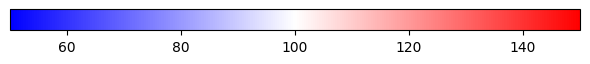

,Schizophrenia,Depressive,Anxiety,Bipolar,Eating
country,,,,,
Afghanistan,97.567989,98.980208,102.921948,99.519427,91.945143
Albania,102.241521,103.307772,104.875245,100.140259,131.726111
Algeria,99.567051,97.119915,103.153393,99.993856,108.279009
American Samoa,96.933329,99.169115,102.951073,100.087707,91.349668
Andorra,98.720400,98.338491,102.359939,100.934099,109.958033
Angola,102.732968,96.526961,99.659284,100.044017,125.805761
Antigua and Barbuda,101.781774,100.070867,101.216339,99.850067,115.495088
Argentina,100.246483,92.902387,98.241881,106.294502,117.317164
Armenia,101.845473,105.175414,101.089701,99.986509,119.335812


In [136]:
pd.set_option("display.max_rows", 500)
df_mh_1990=df_mh[df_mh.year==1990].drop(["year","code"],axis=1).set_index("country")
df_mh_2019=df_mh[df_mh.year==2019].drop(["year","code"],axis=1).set_index("country")
print("                Fold Change Percentage of 2019 vs 1990 Prevalence")
fig, ax = plt.subplots(figsize=(6, 0.75))
cmap = mpl.colormaps['bwr']
norm = mpl.colors.Normalize(50, 150) 
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), ax,orientation='horizontal')
plt.tight_layout()
plt.show()
(df_mh_2019/df_mh_1990*100).style.background_gradient(cmap=cmap,vmin=50,vmax=150)

Fold-change (FC) values describe the relative change in disorder prevalence between **1990 and 2019**:
- **FC = 100** → no net change.
- **FC > 100** → increased prevalence.
- **FC < 100** → decreased prevalence.

Across all disorders and 190+ countries, FC values generally cluster between **95 and 110**, indicating **moderate but widespread shifts** rather than explosive growth or collapse. However, certain disorders and countries show **systematic trends**, suggesting changing sociocultural, diagnostic, and epidemiological dynamics. **Stable biological disorders** (schizophrenia, bipolar) remained constant. **Culturally and psychosocially sensitive disorders** (anxiety, depression, eating) have **expanded considerably**, especially in **urbanized, high-income, or rapidly modernizing societies**. Geographic differences reveal that **Western lifestyle patterns and diagnostic capacity** amplify recorded prevalence, while **limited surveillance in low-income regions** may obscure true changes.

**Cross-Disorder Global Trends**

| Disorder | Global Pattern | Key Insights |
|-----------|----------------|---------------|
| **Schizophrenia** | Stable (mostly 97–103) | Prevalence remained almost unchanged globally. Small growth in parts of SE Asia and Eastern Europe (e.g., Cambodia, Myanmar), slight declines in Western Europe. Reflects biological constancy and limited diagnostic drift. |
| **Depressive Disorders** | Highly variable (80–115) | Strong polarization: sharp decreases (<90) in Western & Northern Europe (Austria, France, Finland), but **substantial increases** (>110) in parts of Latin America (Mexico, Uruguay) and Asia (Malaysia). Suggests rising detection and societal stress in developing high-income contexts. |
| **Anxiety Disorders** | Systematic increase (100–110, occasionally >120) | Most consistent global rise. Largest surges in **Americas, Middle East, and South-East Asia** (Brazil, Turkey, Nepal). Only limited declines (Japan, Norway). Indicates intensification of stress-related conditions linked to urbanization, digital exposure, and economic transitions. |
| **Bipolar Disorders** | Near-neutral (≈100) | Minimal variation globally. Small positive deviations in Australia, Uruguay, Ireland; negligible change elsewhere. Likely reflects diagnostic stability and long-term chronic nature of the condition. |
| **Eating Disorders** | Strong upward trend, highly heterogeneous | The **most dynamic disorder**: FC values frequently exceed **130–170** (e.g., China, Myanmar, Laos, Vietnam, Australia). Indicates dramatic expansion of prevalence, tied to **Westernization, media exposure, and shifting beauty ideals**. Isolated declines (<95) in poorer African and Pacific regions (e.g., Libya, Somalia). |

**Regional and Cultural Patterns**

- **Europe & North America:**  
  Mixed evolution. Depressive and anxiety disorders largely increased in Southern and Eastern Europe (Portugal, Poland), while Northern Europe often shows slight declines in depression but **stable or rising anxiety**. Eating disorders exhibit the **strongest growth** in high-income Western countries, consistent with cultural and societal pressures.

- **Asia-Pacific:**  
  Marked **surge in eating and anxiety disorders**, especially in East and South-East Asia (China +72%, Vietnam +54%, Thailand +40%). Rapid modernization, digital globalization, and changing body image norms contribute to this trend. Schizophrenia and bipolar remain mostly unchanged.

- **Middle East & North Africa:**  
  Moderate increases in anxiety and eating disorders (Iran, Egypt, Saudi Arabia). Depression trends are mixed, with some declines (Libya) likely linked to socio-political instability and under-reporting.

- **Sub-Saharan Africa:**  
  Slight overall increases in anxiety and schizophrenia, but **limited diagnostic growth**. Some countries (Uganda, Ghana, Tanzania) show small positive FCs, while others (Burundi, Somalia) exhibit declines, possibly due to limited health surveillance and diagnostic access.

- **Latin America:**  
  Clear upward trajectory for anxiety and depression in several nations (Mexico, Chile, Uruguay, Brazil). Cultural shifts, economic instability, and greater recognition of mental health are probable drivers. Eating disorders also rising sharply.

- **High-Income Island States (Australia, New Zealand, Malta):**  
  Exhibit some of the **strongest positive fold changes** in eating disorders (+130–145), reflecting both higher awareness and genuine prevalence increase.  
  
**Notable Outliers**

- **Equatorial Guinea (Eating FC ≈ 246)** – extreme outlier; may reflect data artefacts or emerging high-income consumption patterns.
- **China (Eating FC ≈ 172)** – one of the strongest true increases, aligning with cultural westernization.
- **Singapore (Depression FC ≈ 71)** – significant decline; possible under-detection or public-health progress.
- **Norway (Depression FC ≈ 109)** and **United States (Depression FC ≈ 115)** – rising depression levels despite high income, supporting the stress–diagnosis hypothesis.   


In [85]:
geo_data_1990=geo.merge(df_mh_burden[df_mh_burden.year==1990],left_on="id",right_on="code",how="inner")
geo_data_2019=geo.merge(df_mh_burden[df_mh_burden.year==2019],left_on="id",right_on="code",how="inner")

In [86]:
colormap = cm.linear.YlOrRd_09.scale(geo_data_1990['Anxiety'].min(), geo_data_2019['Anxiety'].max()).to_step(7)
m = plugins.DualMap(location=[0,0],zoom_start=2,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Anxiety Disorders DALYs rate per 100000 population"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Anxiety']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL_1990=folium.features.GeoJson(geo_data_1990,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Anxiety'],aliases=['Country','Anxiety Disorders DALYs rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
NIL_2019=folium.features.GeoJson(geo_data_2019,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Anxiety'],aliases=['Country','Anxiety Disorders DALYs rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m.m2)
title_html1 = '<h1 style="position:absolute;z-index:100000;left:4vw" >1990</h1>'
m.get_root().html.add_child(folium.Element(title_html1))
title_html2 = '<h1 style="position:absolute;z-index:100000;left:54vw" >2019</h1>'
m.get_root().html.add_child(folium.Element(title_html2))
m.m1.add_child(NIL_1990)
m.m2.add_child(NIL_2019)
m



In [87]:
colormap = cm.linear.YlOrRd_09.scale(geo_data_1990['Schizophrenia'].min(), geo_data_2019['Schizophrenia'].max()).to_step(7)
m = plugins.DualMap(location=[0,0],zoom_start=2,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Schizophrenia Disorders DALYs rate per 100000 population"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Schizophrenia']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL_1990=folium.features.GeoJson(geo_data_1990,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Schizophrenia'],aliases=['Country','Schizophrenia Disorders DALYs rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
NIL_2019=folium.features.GeoJson(geo_data_2019,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Schizophrenia'],aliases=['Country','Schizophrenia Disorders DALYs rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m.m2)
m.m1.add_child(NIL_1990)
m.m2.add_child(NIL_2019)
title_html1 = '<h1 style="position:absolute;z-index:100000;left:4vw" >1990</h1>'
m.get_root().html.add_child(folium.Element(title_html1))
title_html2 = '<h1 style="position:absolute;z-index:100000;left:54vw" >2019</h1>'
m.get_root().html.add_child(folium.Element(title_html2))
m



In [88]:
colormap = cm.linear.YlOrRd_09.scale(geo_data_1990['Eating'].min(), geo_data_2019['Eating'].max()).to_step(7)
m = plugins.DualMap(location=[0,0],zoom_start=2,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Eating Disorders DALYs rate per 100000 population"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Eating']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL_1990=folium.features.GeoJson(geo_data_1990,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Eating'],aliases=['Country','Eating Disorders DALYs rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
NIL_2019=folium.features.GeoJson(geo_data_2019,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Eating'],aliases=['Country','Eating Disorders DALYs rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m.m2)
m.m1.add_child(NIL_1990)
m.m2.add_child(NIL_2019)
title_html1 = '<h1 style="position:absolute;z-index:100000;left:4vw" >1990</h1>'
m.get_root().html.add_child(folium.Element(title_html1))
title_html2 = '<h1 style="position:absolute;z-index:100000;left:54vw" >2019</h1>'
m.get_root().html.add_child(folium.Element(title_html2))
m



In [89]:
colormap = cm.linear.YlOrRd_09.scale(geo_data_1990['Bipolar'].min(), geo_data_2019['Bipolar'].max()).to_step(7)
m = plugins.DualMap(location=[0,0],zoom_start=2,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Bipolar Disorders DALYs rate per 100000 population"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Bipolar']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL_1990=folium.features.GeoJson(geo_data_1990,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Bipolar'],aliases=['Country','Bipolar Disorders DALYs rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
NIL_2019=folium.features.GeoJson(geo_data_2019,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Bipolar'],aliases=['Country','Bipolar Disorders DALYs rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m.m2)
m.m1.add_child(NIL_1990)
m.m2.add_child(NIL_2019)
title_html1 = '<h1 style="position:absolute;z-index:100000;left:4vw" >1990</h1>'
m.get_root().html.add_child(folium.Element(title_html1))
title_html2 = '<h1 style="position:absolute;z-index:100000;left:54vw" >2019</h1>'
m.get_root().html.add_child(folium.Element(title_html2))
m



In [90]:
colormap = cm.linear.YlOrRd_09.scale(geo_data_1990['Depressive'].min(), geo_data_2019['Depressive'].max()).to_step(7)
m = plugins.DualMap(location=[0,0],zoom_start=2,control_scale=True)
folium.TileLayer('CartoDB positron',name="Light Map",control=False,attr = "Luna Pérez Troncoso").add_to(m)
colormap.caption = "Depressive Disorders DALYs rate per 100000 population"
style_function = lambda x: {"weight":0.1,'color':'black','fillColor':colormap(x['properties']['Depressive']), 'fillOpacity':0.9}
highlight_function = lambda x: {'fillColor': '#000000', 'color': '#FFFFFF', 'fillOpacity': 0.5, 'weight': 0.5}
NIL_1990=folium.features.GeoJson(geo_data_1990,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Depressive'],aliases=['Country','Depressive Disorders DALYs rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
NIL_2019=folium.features.GeoJson(geo_data_2019,style_function=style_function,control=False,highlight_function=highlight_function,tooltip=folium.features.GeoJsonTooltip(fields=['name','Depressive'],aliases=['Country','Depressive Disorders DALYs rate per 100000 population'],
style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),sticky=True))
colormap.add_to(m.m2)
m.m1.add_child(NIL_1990)
m.m2.add_child(NIL_2019)
title_html1 = '<h1 style="position:absolute;z-index:100000;left:4vw" >1990</h1>'
m.get_root().html.add_child(folium.Element(title_html1))
title_html2 = '<h1 style="position:absolute;z-index:100000;left:54vw" >2019</h1>'
m.get_root().html.add_child(folium.Element(title_html2))
m



                Fold Change Percentage of 2019 vs 1990 DALYs Rate


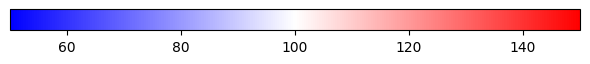

,Schizophrenia,Depressive,Anxiety,Bipolar,Eating
country,,,,,
Afghanistan,99.437365,98.110732,100.393189,93.353642,103.841596
Albania,104.713953,102.600899,100.370158,131.111860,105.179915
Algeria,96.528612,99.407919,99.930002,108.397593,103.085001
American Samoa,97.820164,96.179309,99.522699,91.191178,102.352073
Andorra,97.750259,98.502230,100.679570,109.987315,102.080366
Angola,96.113847,103.197916,100.673612,126.280223,100.185911
Antigua and Barbuda,99.854408,101.597460,99.713002,115.396927,100.982209
Argentina,94.092971,100.056825,106.278813,117.119939,98.201690
Armenia,106.905066,102.450416,100.372815,119.737866,101.465914


In [135]:
df_mh_burden_1990=df_mh_burden[df_mh_burden.year==1990].drop(["year","code"],axis=1).set_index("country")
df_mh_burden_2019=df_mh_burden[df_mh_burden.year==2019].drop(["year","code"],axis=1).set_index("country")
print("                Fold Change Percentage of 2019 vs 1990 DALYs Rate")
fig, ax = plt.subplots(figsize=(6, 0.75))
cmap = mpl.colormaps['bwr']
norm = mpl.colors.Normalize(50, 150) 
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), ax,orientation='horizontal')
plt.tight_layout()
plt.show()
(df_mh_burden_2019/df_mh_burden_1990*100).style.background_gradient(cmap=cmap, vmin=50,vmax=150)

Overall, the distribution of DALYs fold-change values shows **limited global variation** (typically between 95 and 110), but **directionally divergent trends** emerge across disorders and regions. These differences reveal how **medical progress, health system capacity, and cultural factors** shape the actual lived impact of mental illness beyond prevalence alone. **Chronic and biologically rooted disorders** (schizophrenia, bipolar) maintained or increased their burden in developing regions, highlighting care inequities. **Culturally sensitive disorders** (depression, anxiety, eating) show rising burden in **high-income and rapidly modernizing countries**, where **social pressures and digital environments magnify psychological strain**. In summery, developed countries' **individuals **live longer but with persistent functional impairment**.

**Cross-Disorder Global Trends**

| Disorder | Global Pattern | Key Insights |
|-----------|----------------|---------------|
| **Schizophrenia** | Mild decrease globally (≈95–100), but increases in South & East Asia (India, Malaysia, South Korea, Vietnam). | Stable prevalence but variable outcomes: countries with limited long-term treatment (South/Southeast Asia, parts of Eastern Europe) show rising DALY rates, indicating persistent disability despite possible diagnostic progress. |
| **Depressive Disorders** | Broad stability (≈98–104) with moderate increases in low- and middle-income nations. | Reflects partial improvements in management in high-income regions (Europe, North America) but growing severity and chronicity elsewhere. Suggests that awareness increased faster than effective care. |
| **Anxiety Disorders** | Almost universally stable (≈99–101). | Although prevalence increased, the **burden per capita remained constant**, suggesting that anxiety disorders are **better managed or less disabling** despite spreading more widely. High-income countries show DALY plateaus, pointing to therapeutic containment. |
| **Bipolar Disorder** | Strong and consistent increases (110–160, peaking at >170 in China, Myanmar, Vietnam). | Indicates a **rising chronic disability load**, even where prevalence barely changed. Suggests that individuals live longer with bipolar disorder but with sustained impairment, reflecting treatment-resistant or recurrent forms. |
| **Eating Disorders** | Mild but widespread increase (≈102–108, locally >120 in some Asian and American nations). | The expansion in DALYs is less pronounced than the rise in prevalence, implying some improvement in case management. However, countries such as the UK, Spain, and Turkey show marked growth (>105), revealing persistent disability linked to cultural and social pressures. |

**Regional and Cultural Patterns**

- **Europe & North America:**  
  - Burden **declines slightly** for schizophrenia and depression (e.g., France, Finland, UK).  
  - **Increases for bipolar and eating disorders**, especially in Southern and Western Europe (Spain, Portugal, Italy, UK).  
  - Suggests that while medical treatment reduces mortality and some disability, **sociocultural pressures sustain functional burden** for affective and eating disorders.  
  - The **United States and Uruguay** stand out with high DALYs increases in multiple disorders (schizophrenia +22%, anxiety +5%, eating +8%), indicating a persistent mental health strain despite advanced healthcare access.

- **Asia-Pacific:**  
  - Strong upward trends in **bipolar and schizophrenia DALYs** (India +50%, China +71%, Thailand +40%, Vietnam +54%).  
  - **Eating disorder burden rises** moderately in high-growth economies (Malaysia, Laos, Thailand).  
  - Reflects the **psychosocial cost of rapid modernization**, cultural transition, and unequal access to long-term psychiatric care.

- **Middle East & North Africa:**  
  - Moderate increases in burden for bipolar and eating disorders (Iran, Egypt, Saudi Arabia).  
  - Slight reductions in depression and anxiety suggest growing treatment capacity in wealthier states.  
  - In contrast, **Libya** and **Syria** show mixed signals—declines in prevalence but persistent or worsening DALY rates—hinting at underreporting and disrupted healthcare access.

- **Sub-Saharan Africa:**  
  - Generally **stable or slightly increased DALYs** (≈101–105 across disorders).  
  - Stronger rises for **bipolar** and **eating disorders** in Uganda, Tanzania, and Mozambique.  
  - Reflects emerging recognition and improved survival rather than an actual rise in disease frequency.

- **Latin America:**  
  - **Increasing DALYs** for affective and bipolar disorders (Mexico +20%, Brazil +15%).  
  - Cultural modernization and health system strain drive worsening disability profiles, even as prevalence stabilizes.  
  - **Eating disorders** show particularly strong growth in Brazil and Mexico, reinforcing the sociocultural link between economic development and mental health burden.

- **High-Income Island States (Australia, New Zealand, Iceland):**  
  - Bipolar disorder DALYs rose steeply (Australia +43%), suggesting that **chronic management improvements extend lifespan but not full recovery**.  
  - Slight gains in eating disorder DALYs mirror global cultural exposure and urban pressures.

**Notable Outliers**

- **United States (+22.7% in schizophrenia, +8.4% in eating disorders)** – suggests increasing functional impairment despite stable prevalence.  
- **Myanmar and Vietnam (>160% DALYs increase for bipolar)** – extreme outliers driven by regional health inequities and limited psychiatric coverage.  
- **Spain and Turkey** – strong increases across several disorders, reflecting cultural convergence and diagnostic intensification.  
- **Singapore** – marked decline in schizophrenia DALYs (−32%), possibly due to early intervention programs and healthcare modernization.  


In conclusion, the last three decades have marked a **transition from underrecognition to chronic persistence** in the global mental health landscape. The **DALYs burden data reflects not only disease frequency but the enduring social, cultural, and systemic obstacles** to achieving true recovery and well-being across diverse world regions.